# Importing the Libraries

In [219]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_columns', None)

# Read the Data

In [220]:
# !pip install pandas

In [221]:
# Specify the file path to your Excel file
file_path = r'C:\Users\Shahbaz\Desktop\socool\exam\clustering\cluster.xlsx'
cluster_data = pd.read_excel(file_path, sheet_name='cluster')
data = cluster_data.copy()

In [222]:
# features
cluster_features = pd.read_excel(file_path, sheet_name='features')

# Features
- CUST_ID: Customer identifier.
- BALANCE: Current balance amount on the credit card.
- BALANCE_FREQUENCY: How frequently the balance is updated, based on a scale from 0 to 1.
- PURCHASES: Total amount of purchases made.
- ONEOFF_PURCHASES: Total amount of one-time purchases.
- INSTALLMENTS_PURCHASES: Total amount of purchases made in installments.
- CASH_ADVANCE: Total amount of cash advances taken.
- PURCHASES_FREQUENCY: How frequently purchases are made, based on a scale from 0 to 1.
- ONEOFF_PURCHASES_FREQUENCY: Frequency of one-time purchases, based on a scale from 0 to 1.
- PURCHASES_INSTALLMENTS_FREQUENCY: Frequency of installment purchases, based on a scale from 0 to 1.
- CASH_ADVANCE_FREQUENCY: Frequency of cash advances taken, based on a scale from 0 to 1.
- CASH_ADVANCE_TRX: Number of transactions involving cash advances.
- PURCHASES_TRX: Number of purchase transactions made.
- CREDIT_LIMIT: Credit limit assigned to the customer.
- PAYMENTS: Total amount of payments done by the customer.
- MINIMUM_PAYMENTS: Minimum payments due from the customer.
- PRC_FULL_PAYMENT: Percentage of full payment made by the customer.
- TENURE: Number of months the customer has been with the credit card provider.

### new features:
- avg_cash_advance --> CASH_ADVANCE / CASH_ADVANCE_TRX
- avg_purchases --> PURCHASES / PURCHASES_TRX

In [223]:
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [224]:
data.shape

(8950, 18)

In [225]:
data.describe(include='all')

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
unique,8950,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,C10001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,NaN,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,NaN,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,NaN,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,NaN,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000


In [226]:
data.isnull().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [227]:
data = data.dropna(subset=['CREDIT_LIMIT'], how='any', axis=0) # we may drop because it is just 1 row and it will not affect much

In [228]:
data['MINIMUM_PAYMENTS'] = data['MINIMUM_PAYMENTS'].fillna(data['MINIMUM_PAYMENTS'].mean())

In [229]:
data.isnull().sum() # missing values are handled

CUST_ID                             0
BALANCE                             0
BALANCE_FREQUENCY                   0
PURCHASES                           0
ONEOFF_PURCHASES                    0
INSTALLMENTS_PURCHASES              0
CASH_ADVANCE                        0
PURCHASES_FREQUENCY                 0
ONEOFF_PURCHASES_FREQUENCY          0
PURCHASES_INSTALLMENTS_FREQUENCY    0
CASH_ADVANCE_FREQUENCY              0
CASH_ADVANCE_TRX                    0
PURCHASES_TRX                       0
CREDIT_LIMIT                        0
PAYMENTS                            0
MINIMUM_PAYMENTS                    0
PRC_FULL_PAYMENT                    0
TENURE                              0
dtype: int64

In [230]:
data = data.drop('CUST_ID', axis=1) # dropping meaningless customer ID column

# Check the Data

In [231]:
data.info() # this is fully numeric data

<class 'pandas.core.frame.DataFrame'>
Index: 8949 entries, 0 to 8949
Data columns (total 17 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   BALANCE                           8949 non-null   float64
 1   BALANCE_FREQUENCY                 8949 non-null   float64
 2   PURCHASES                         8949 non-null   float64
 3   ONEOFF_PURCHASES                  8949 non-null   float64
 4   INSTALLMENTS_PURCHASES            8949 non-null   float64
 5   CASH_ADVANCE                      8949 non-null   float64
 6   PURCHASES_FREQUENCY               8949 non-null   float64
 7   ONEOFF_PURCHASES_FREQUENCY        8949 non-null   float64
 8   PURCHASES_INSTALLMENTS_FREQUENCY  8949 non-null   float64
 9   CASH_ADVANCE_FREQUENCY            8949 non-null   float64
 10  CASH_ADVANCE_TRX                  8949 non-null   int64  
 11  PURCHASES_TRX                     8949 non-null   int64  
 12  CREDIT_LIMI

# Scaling the Data

In [232]:
from sklearn.preprocessing import StandardScaler

In [233]:
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

In [234]:
data_scaled = pd.DataFrame(data_scaled, columns=data.columns)

In [235]:
data_scaled.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,-0.732054,-0.249881,-0.424934,-0.356957,-0.349114,-0.466805,-0.806649,-0.678716,-0.707409,-0.675294,-0.476083,-0.511381,-0.960380,-0.529026,-3.109947e-01,-0.525588,0.360541
1,0.786858,0.134049,-0.469584,-0.356957,-0.454607,2.605438,-1.221928,-0.678716,-0.917090,0.573949,0.110032,-0.591841,0.688601,0.818546,8.926366e-02,0.234159,0.360541
2,0.447041,0.517980,-0.107716,0.108843,-0.454607,-0.466805,1.269742,2.673295,-0.917090,-0.675294,-0.476083,-0.109082,0.826016,-0.383857,-1.017005e-01,-0.525588,0.360541
3,0.049015,-1.017743,0.231995,0.546123,-0.454607,-0.368678,-1.014290,-0.399383,-0.917090,-0.258882,-0.329554,-0.551611,0.826016,-0.598733,4.878069e-17,-0.525588,0.360541
4,-0.358849,0.517980,-0.462095,-0.347317,-0.454607,-0.466805,-1.014290,-0.399383,-0.917090,-0.675294,-0.476083,-0.551611,-0.905414,-0.364421,-2.658206e-01,-0.525588,0.360541


# How many clusters should we set?!

In [236]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [237]:
def check_k(data, max_cluster):
    wcss = []
    silhouette_scores = []
    prev_wcss = None
    
    for i in range(2, max_cluster + 1):
        kmeans = KMeans(n_clusters=i)
        kmeans.fit(data)
        
        wcss_iter = kmeans.inertia_
        wcss.append(wcss_iter)
        
        y = kmeans.predict(data)
        silhouette_iter = silhouette_score(data, y)
        silhouette_scores.append(silhouette_iter)
        
        wcss_str = '{:.30f}'.format(wcss_iter)
        print(f'Cluster {i}: WCSS = {wcss_str}; Silhouette Score = {silhouette_iter}')
        
        if prev_wcss is not None:
            wcss_diff = prev_wcss - wcss_iter
            wcss_diff_str = '{:.30f}'.format(wcss_diff)
            print(f'Difference from previous WCSS: {wcss_diff_str}')
        
        prev_wcss = wcss_iter
    
    number_clusters = range(2, max_cluster + 1)
    plt.plot(number_clusters, wcss)
    plt.title('The Elbow Method')
    plt.xlabel('Number of clusters')
    plt.ylabel('Within-cluster Sum of Squares')
    plt.show()

Cluster 2: WCSS = 127773.039066041936166584491729736328; Silhouette Score = 0.20948941929133194
Cluster 3: WCSS = 111975.621273042110260576009750366211; Silhouette Score = 0.25111819672814145
Difference from previous WCSS: 15797.417792999825906008481979370117
Cluster 4: WCSS = 99065.824269593285862356424331665039; Silhouette Score = 0.1975866678555425
Difference from previous WCSS: 12909.797003448824398219585418701172
Cluster 5: WCSS = 91495.159636515279999002814292907715; Silhouette Score = 0.19316716374436665
Difference from previous WCSS: 7570.664633078005863353610038757324
Cluster 6: WCSS = 84845.740939731651451438665390014648; Silhouette Score = 0.20262861443850702
Difference from previous WCSS: 6649.418696783628547564148902893066
Cluster 7: WCSS = 79516.566917258038301952183246612549; Silhouette Score = 0.2147442557222051
Difference from previous WCSS: 5329.174022473613149486482143402100
Cluster 8: WCSS = 74614.098522072396008297801017761230; Silhouette Score = 0.2219082343130720

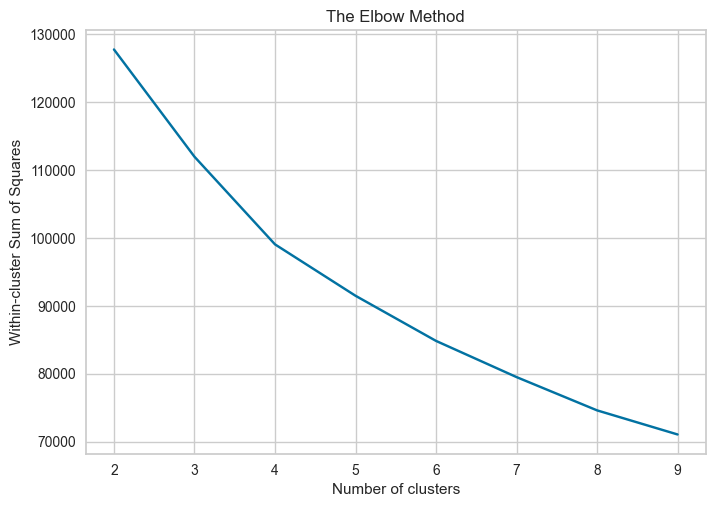

In [238]:
check_k(data_scaled, 9)

In [239]:
from yellowbrick.cluster import KElbowVisualizer
import warnings
import sys
if not sys.warnoptions:
    warnings.simplefilter('ignore')
np.random.seed(42)

Elbow Method to determine the number of clusters to be formed:


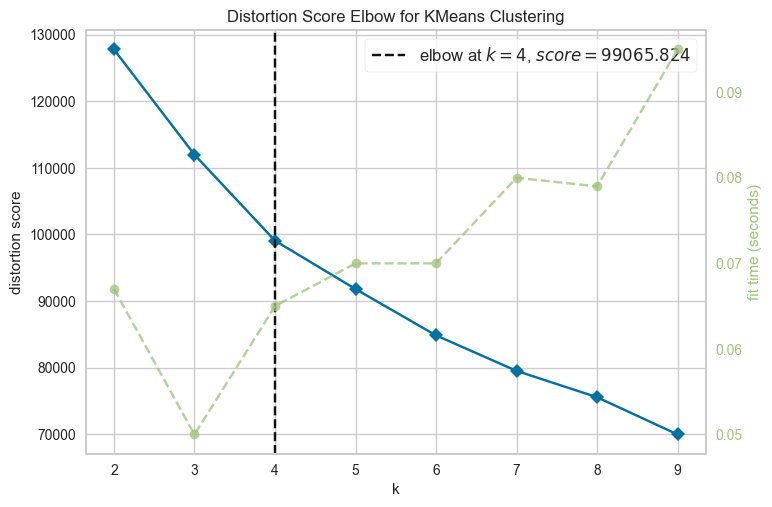

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [240]:
print('Elbow Method to determine the number of clusters to be formed:')
elbow_method = KElbowVisualizer(KMeans(), k=9)
elbow_method.fit(data_scaled)
elbow_method.show()

# Set the K amount

* though k_elbowvisualizer says k should be 4

In [241]:
k = 3
"""
    the optimal Silhouette is 0.25 in k amount 3,
    at the same time difference between previous WCSS is more than the others
"""

'\n    the optimal Silhouette is 0.25 in k amount 3,\n    at the same time difference between previous WCSS is more than the others\n'

In [242]:
kmeans = KMeans(n_clusters=k)
kmeans.fit(data_scaled)

KMeans(n_clusters=3)

In [243]:
y = kmeans.predict(data_scaled)

In [244]:
cluster_data_kmeans = cluster_data.loc[cluster_data['CREDIT_LIMIT'].notnull()]

In [245]:
cluster_data_kmeans['Cluster'] = y

# Visualization with PairPlot in KMeans Clustering

<Figure size 2000x2000 with 0 Axes>

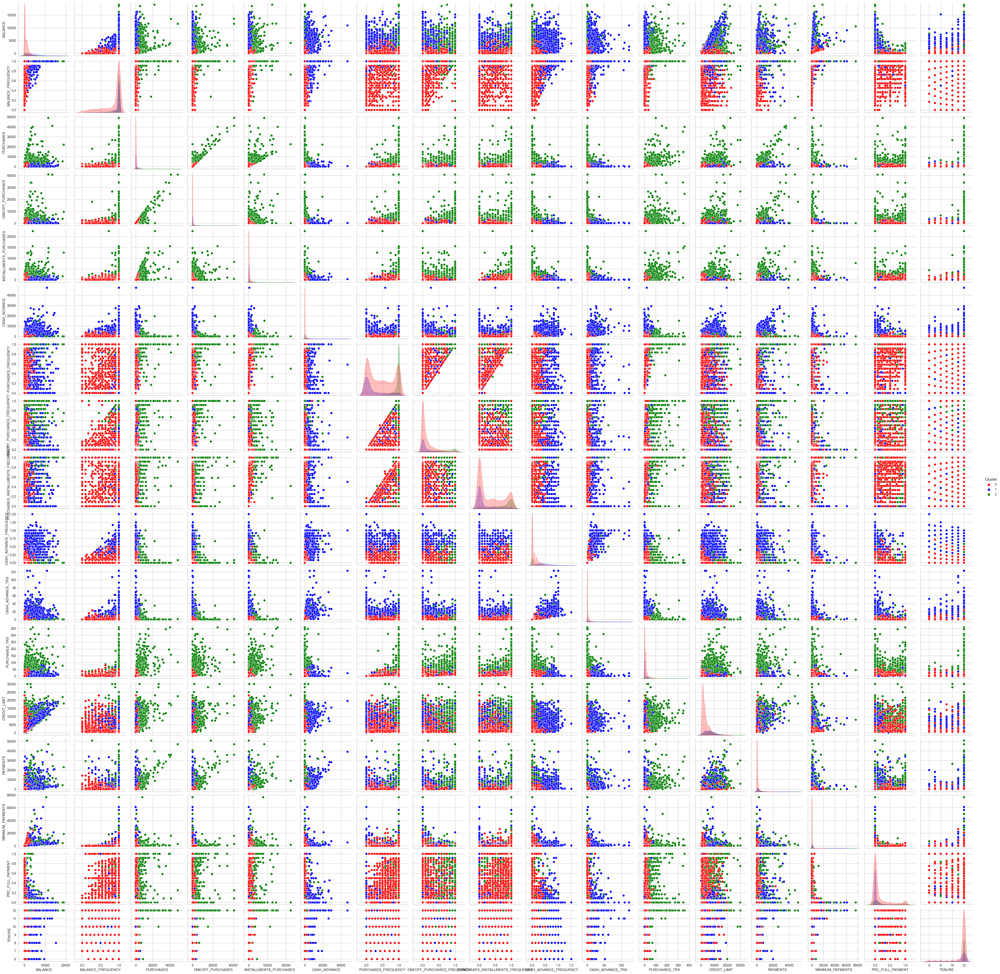

In [246]:
numeric_columns = cluster_data_kmeans.select_dtypes(include=np.number).columns
custom_palette = ['red', 'blue', 'green']

plt.figure(figsize=(20, 20))
sns.pairplot(cluster_data_kmeans[numeric_columns], hue='Cluster', palette=custom_palette)
plt.show()

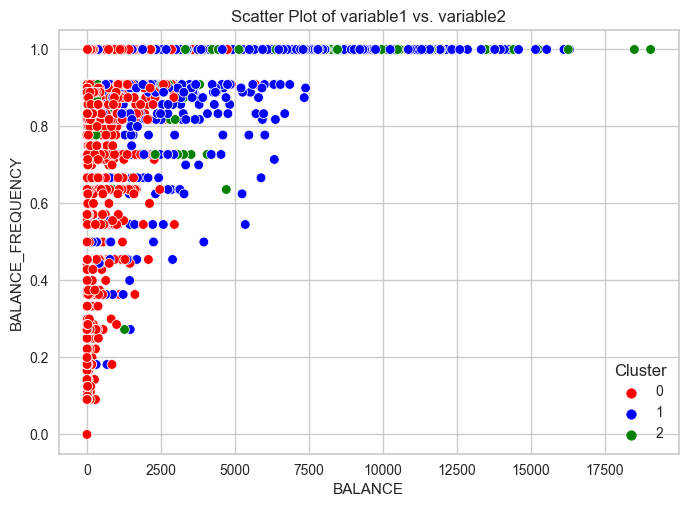

In [248]:
sns.scatterplot(x='BALANCE', y='BALANCE_FREQUENCY', data=cluster_data_kmeans[numeric_columns], hue='Cluster', palette=['red', 'blue', 'green'])
plt.title('Scatter Plot of variable1 vs. variable2')
plt.show()

### *we may get valuable information by looking at each grap individually*
- *above as an example*

# Hierarchical Clustering to find K amount

In [249]:
import scipy.cluster.hierarchy as hcl

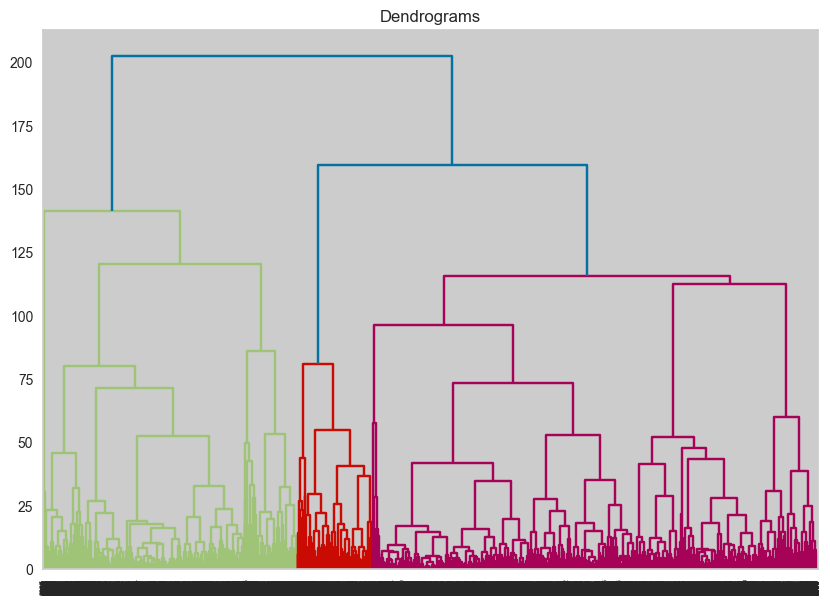

In [250]:
plt.figure(figsize=(10, 7))
plt.title("Dendrograms")
dend = hcl.dendrogram(hcl.linkage(data_scaled, method='ward'))

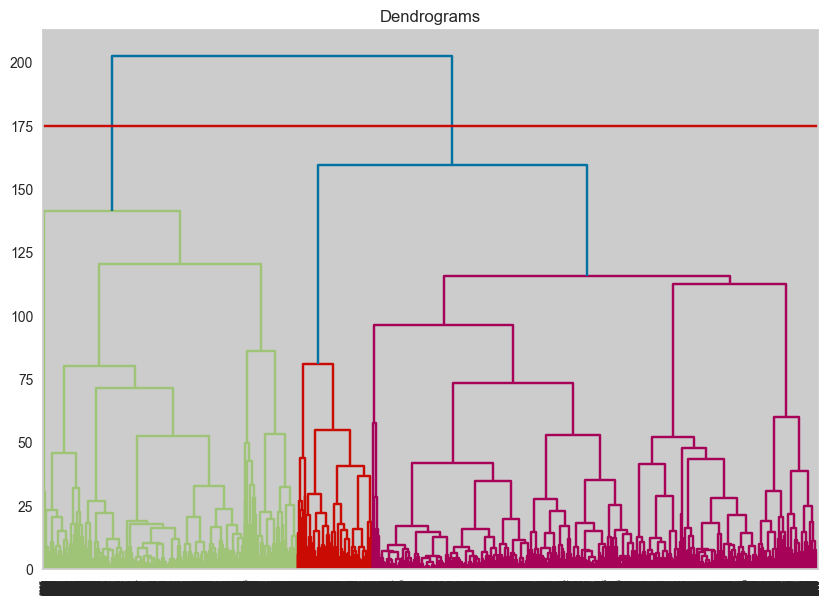

In [ ]:
plt.figure(figsize=(10, 7))  
plt.title("Dendrograms")  
dend = hcl.dendrogram(hcl.linkage(data_scaled, method='ward'))
plt.axhline(y = 175, color='r')

# Agglomerative Clustering

In [251]:
from sklearn.cluster import AgglomerativeClustering
agg_cluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
y = agg_cluster.fit_predict(data_scaled)
y

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [252]:
np.unique(y)

array([0, 1], dtype=int64)

In [253]:
cluster_data_agg = cluster_data.loc[cluster_data['CREDIT_LIMIT'].notnull()]
cluster_data_agg['Cluster'] = y

In [254]:
cluster_data_agg.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,0
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,0
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,0
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12,0
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,0


In [255]:
cluster_data_agg['Cluster'].value_counts()

Cluster
0    6001
1    2948
Name: count, dtype: int64

In [256]:
cluster_data_kmeans['Cluster'].value_counts()

Cluster
0    6117
1    1597
2    1235
Name: count, dtype: int64

# Visualization with PairPlot in AgglomerativeClustering

<Figure size 2000x2000 with 0 Axes>

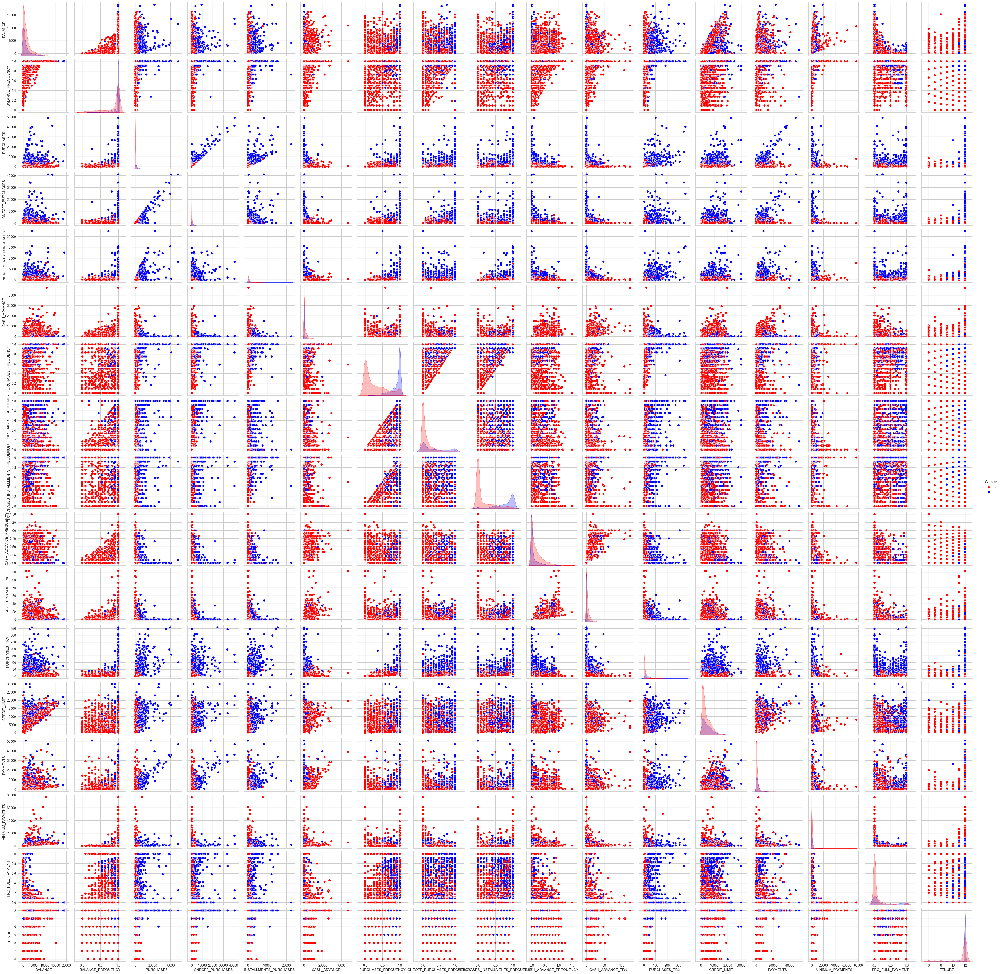

In [257]:
numeric_columns = cluster_data_agg.select_dtypes(include=np.number).columns
custom_palette = ['red', 'blue']

plt.figure(figsize=(20, 20))
sns.pairplot(cluster_data_agg[numeric_columns], hue='Cluster', palette=custom_palette)
plt.show()